# **Proyecto Final - Curso de Data Analytics con Educación IT y Digit@lers**
![Imagen de Ciudad de Buenos Aires](img/ciudadba.jpg)


## Objetivos
El objetivo de este proyecto es analizar el conjunto de datos de delitos en la ciudad de Buenos Aires del año 2021 y responder las siguientes preguntas:
1. El día con mayor cantidad de delitos de todo el 2019 (usando groupby).
2. Usar un gráfico de barras para mostrar el top 5 de barrios más peligrosos.
3. Usar un gráfico de barras mostrar el top 5 de barrios más seguros.
4. Crear una nueva columna llamada “mes”, y basarse en ella para averiguar cuál es el mes más inseguro.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv("db/delitos_2021.csv", sep=";")
data

,id-mapa,anio,mes,dia,fecha,franja,tipo,subtipo,uso_armas,barrio,comuna,latitud,longitud,cantidad
0,HC-2021-1008202,2021,Enero,Miércoles,06/01/2021,18,Homicidio,Siniestro Vial,NaN,Constitución,1.0,"-34,62761","-58,379146",1.0
1,HC-2021-1009094,2021,Enero,Jueves,07/01/2021,10,Homicidio,Siniestro Vial,NaN,Mataderos,9.0,"-34,64972969","-58,51058958",1.0
2,HC-2021-1013236,2021,Enero,Domingo,10/01/2021,7,Homicidio,Siniestro Vial,NaN,Parque Chacabuco,7.0,"-34,62917196","-58,43058079",1.0
3,HC-2021-1014154,2021,Enero,Lunes,11/01/2021,9,Homicidio,Siniestro Vial,NaN,Nueva Pompeya,5.0,"-34,63867577","-58,4145554",1.0
4,HC-2021-1015476,2021,Enero,Lunes,11/01/2021,21,Homicidio,Siniestro Vial,NaN,Parque Avellaneda,9.0,"-34,64771436","-58,46806552",1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88562,RH-2021-3751758,2021,Mayo,Sábado,08/05/2021,10,Hurto (sin violencia),NaN,NaN,Balvanera,3.0,"-34,605751","-58,395375",NaN
88563,RH-2021-3768141,2021,Junio,Martes,29/06/2021,21,Robo (con violencia),NaN,NaN,Palermo,14.0,"-34,59266","-58,422338",NaN
88564,RH-2021-3768589,2021,Junio,Miércoles,30/06/2021,13,Robo (con violencia),NaN,NaN,Balvanera,3.0,"-34,608791","-58,404617",NaN
88565,RH-2021-3783716,2021,Julio,Sábado,31/07/2021,1,Hurto (sin violencia),NaN,NaN,Balvanera,3.0,"-34,603284","-58,394526",NaN


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88567 entries, 0 to 88566
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id-mapa    88567 non-null  object 
 1   anio       88567 non-null  int64  
 2   mes        88567 non-null  object 
 3   dia        88567 non-null  object 
 4   fecha      88567 non-null  object 
 5   franja     88567 non-null  object 
 6   tipo       88567 non-null  object 
 7   subtipo    16321 non-null  object 
 8   uso_armas  8472 non-null   object 
 9   barrio     87390 non-null  object 
 10  comuna     87907 non-null  float64
 11  latitud    88567 non-null  object 
 12  longitud   88567 non-null  object 
 13  cantidad   7299 non-null   float64
dtypes: float64(2), int64(1), object(11)
memory usage: 9.5+ MB


### Normalización del DataFrame

In [4]:
data = data.rename(columns={"tipo":"tipoDelito"})
print(data.columns)

Index(['id-mapa', 'anio', 'mes', 'dia', 'fecha', 'franja', 'tipoDelito',
       'subtipo', 'uso_armas', 'barrio', 'comuna', 'latitud', 'longitud',
       'cantidad'],
      dtype='object')


In [5]:
#reemplazar datos vacios en columna barrio
data['barrio'].fillna("No especifica", inplace=True)
#reemplazar datos vacios por 0
data['comuna'].fillna(0, inplace=True)
#convertir columna comuna en tipo entero
data["comuna"]=data["comuna"].astype(int)

In [6]:
data.dia.unique()

array(['Miércoles', 'Jueves', 'Domingo', 'Lunes', 'Martes', 'Viernes',
       'Sábado', 'jueves', 'martes', 'domingo', 'viernes', 'lunes',
       'miércoles', 'sábado'], dtype=object)

In [7]:
#normalizar la columna dia
data["dia"]=data.dia.replace({"Miércoles":"Miercoles", "miércoles":"Miercoles","jueves":"Jueves","lunes":"Lunes","domingo":"Domingo",
                             "sábado":"Sabado","Sábado":"Sabado","martes":"Martes","viernes":"Viernes"})
data.dia.unique()

array(['Miercoles', 'Jueves', 'Domingo', 'Lunes', 'Martes', 'Viernes',
       'Sabado'], dtype=object)

Convertir la columna 'fecha' de un objeto de tipo cadena de caracteres (string) en un objeto de tipo fecha (datetime) en Pandas

In [8]:
data['fecha'] = pd.to_datetime(data['fecha'], format='%d/%m/%Y')

Agregando una nueva columna llamada "numMes" al DataFrame, que contiene el número correspondiente al mes de cada fecha en la columna "fecha"

In [9]:
#data["numMes"]=data["fecha"].dt.month
    # Obtener la posición de la columna "fecha"
pos_fecha = data.columns.get_loc("fecha")

    #Insertar la columna "numMes" justo después de la columna "fecha"
data.insert(pos_fecha + 1, "numMes", data["fecha"].dt.month)

In [10]:
data.uso_armas.unique()

array([nan, 'Arma cortante', 'Arma de fuego'], dtype=object)

In [27]:
data['uso_armas'] = data['uso_armas'].fillna('Sin armas - No especifica')
data

,id-mapa,anio,mes,dia,fecha,numMes,franja,tipoDelito,subtipo,uso_armas,barrio,comuna,latitud,longitud,cantidad
0,HC-2021-1008202,2021,Enero,Miercoles,2021-01-06,1,18,Homicidio,Siniestro Vial,Sin armas - No especifica,Constitución,1,"-34,62761","-58,379146",1.0
1,HC-2021-1009094,2021,Enero,Jueves,2021-01-07,1,10,Homicidio,Siniestro Vial,Sin armas - No especifica,Mataderos,9,"-34,64972969","-58,51058958",1.0
2,HC-2021-1013236,2021,Enero,Domingo,2021-01-10,1,7,Homicidio,Siniestro Vial,Sin armas - No especifica,Parque Chacabuco,7,"-34,62917196","-58,43058079",1.0
3,HC-2021-1014154,2021,Enero,Lunes,2021-01-11,1,9,Homicidio,Siniestro Vial,Sin armas - No especifica,Nueva Pompeya,5,"-34,63867577","-58,4145554",1.0
4,HC-2021-1015476,2021,Enero,Lunes,2021-01-11,1,21,Homicidio,Siniestro Vial,Sin armas - No especifica,Parque Avellaneda,9,"-34,64771436","-58,46806552",1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88562,RH-2021-3751758,2021,Mayo,Sabado,2021-05-08,5,10,Hurto (sin violencia),NaN,Sin armas - No especifica,Balvanera,3,"-34,605751","-58,395375",NaN
88563,RH-2021-3768141,2021,Junio,Martes,2021-06-29,6,21,Robo (con violencia),NaN,Sin armas - No especifica,Palermo,14,"-34,59266","-58,422338",NaN
88564,RH-2021-3768589,2021,Junio,Miercoles,2021-06-30,6,13,Robo (con violencia),NaN,Sin armas - No especifica,Balvanera,3,"-34,608791","-58,404617",NaN
88565,RH-2021-3783716,2021,Julio,Sabado,2021-07-31,7,1,Hurto (sin violencia),NaN,Sin armas - No especifica,Balvanera,3,"-34,603284","-58,394526",NaN


In [28]:
data.uso_armas.unique()

array(['Sin armas - No especifica', 'Arma cortante', 'Arma de fuego'],
      dtype=object)

### Cantidad total de delitos denunciados

In [11]:
data["tipoDelito"].count()

88567

### El top 5 de barrios con más delitos

In [12]:
data["barrio"].value_counts().head(5)

Palermo      7785
Balvanera    5952
Flores       4842
Recoleta     4397
Caballito    4046
Name: barrio, dtype: int64

### El top 5 de barrios con menos delitos

In [13]:
data["barrio"].value_counts().tail(5)

Versalles        367
Parque Chas      325
Agronomía        296
Puerto Madero    229
Nueva pompeya      2
Name: barrio, dtype: int64

### Franjas horarias con mayor cantidad de delitos

In [14]:
data["franja"].value_counts()

19    5215
18    5136
12    4911
17    4853
20    4841
8     4815
16    4517
10    4517
14    4444
13    4346
9     4340
15    4298
11    4125
7     3953
21    3812
22    3241
23    3030
0     2710
6     2664
5     1761
1     1615
SD    1555
2     1394
3     1257
4     1216
sd       1
Name: franja, dtype: int64

De aca se puede concluir que las 18 y las 19 son los horarios que mas delitos se denuncian y coincide con el horario que mucha cantidad de gente vuelve de trabajar y es el horario de cierre de muchos comercios 

In [15]:
#dia con mas delitos
data.groupby("fecha")["tipoDelito"].count().idxmax()

Timestamp('2021-11-06 00:00:00')

### Gráfico de barras de los barrios que tienen menor cantidad de delitos denunciados
Se podria concluir que son los barrios mas seguros en CABA

<AxesSubplot:>

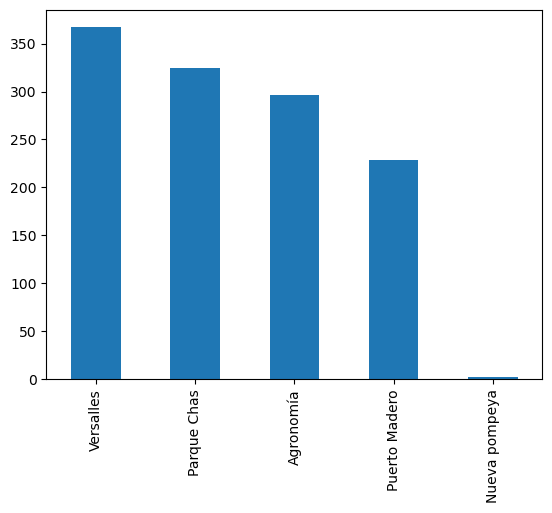

In [16]:
data["barrio"].value_counts().tail(5).plot.bar()

### Gráfico de barras de los barrios que tienen mayor cantidad de delitos denunciados
Se podria deducir que son los barrios mas inseguros de CABA


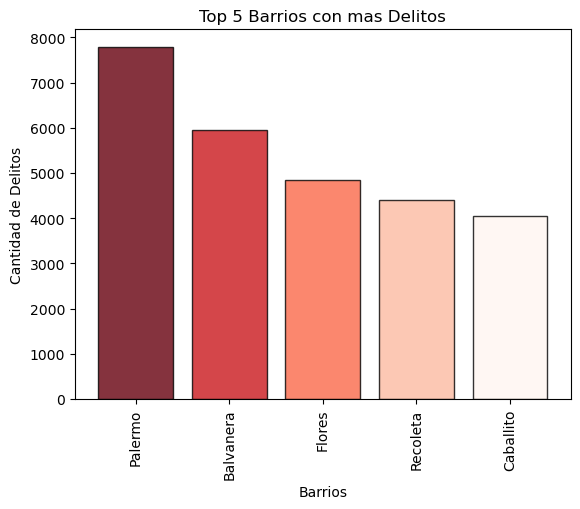

In [17]:
import matplotlib.colors as colors
import matplotlib.cm as cm

n_bars = 5
cmap = cm.get_cmap('Reds')

# Create the colormap
rgba = cmap(np.linspace(0, 1, n_bars))
rgba = rgba[::-1] # Reverse the order of the colors
cmap = colors.ListedColormap(rgba, name='reds_cmap')

data["barrio"].value_counts().head(5).plot.bar(
    color=cmap(np.linspace(0, 1, n_bars)),
    edgecolor='black',
    width=0.8,
    alpha=0.8,
    align='center'
)

plt.xlabel("Barrios")
plt.ylabel("Cantidad de Delitos")
plt.title("Top 5 Barrios con mas Delitos")

# Mostramos el gráfico
plt.show()

*Este grafico se edito la paleta de colores para que valla de un color mas intenso a uno mas claro de acuerdo a la cantidad de delitos*

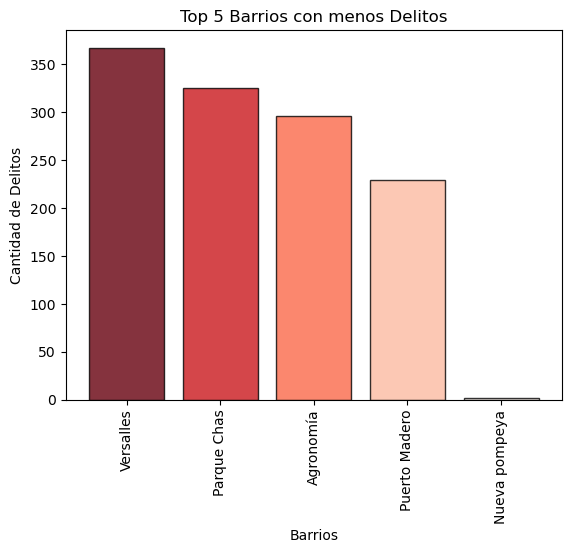

In [18]:
n_bars = 5
cmap = cm.get_cmap('Reds')

# Create the colormap
rgba = cmap(np.linspace(0, 1, n_bars))
rgba = rgba[::-1] # Reverse the order of the colors
cmap = colors.ListedColormap(rgba, name='reds_cmap')

data["barrio"].value_counts().tail(5).plot.bar(
    color=cmap(np.linspace(0, 1, n_bars)),
    edgecolor='black',
    width=0.8,
    alpha=0.8,
    align='center'
)

plt.xlabel("Barrios")
plt.ylabel("Cantidad de Delitos")
plt.title("Top 5 Barrios con menos Delitos")

# Mostramos el gráfico
plt.show()

### Top 5 de barrios con mas Homicidios

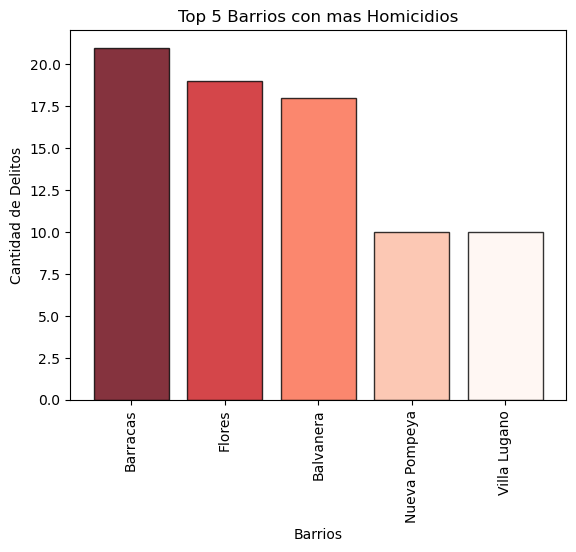

In [19]:
n_bars = 5
cmap = cm.get_cmap('Reds')

# Create the colormap
rgba = cmap(np.linspace(0, 1, n_bars))
rgba = rgba[::-1] # Reverse the order of the colors
cmap = colors.ListedColormap(rgba, name='reds_cmap')

data[data["tipoDelito"] == "Homicidio"]["barrio"].value_counts().head(5).plot.bar(
    color=cmap(np.linspace(0, 1, n_bars)),
    edgecolor='black',
    width=0.8,
    alpha=0.8,
    align='center'
)

plt.xlabel("Barrios")
plt.ylabel("Cantidad de Delitos")
plt.title("Top 5 Barrios con mas Homicidios")

# Mostramos el gráfico
plt.show()

### Mes con mayor cantidad de delitos denunciados

In [20]:
data.groupby("mes")["tipoDelito"].count().idxmax() 

'Diciembre'

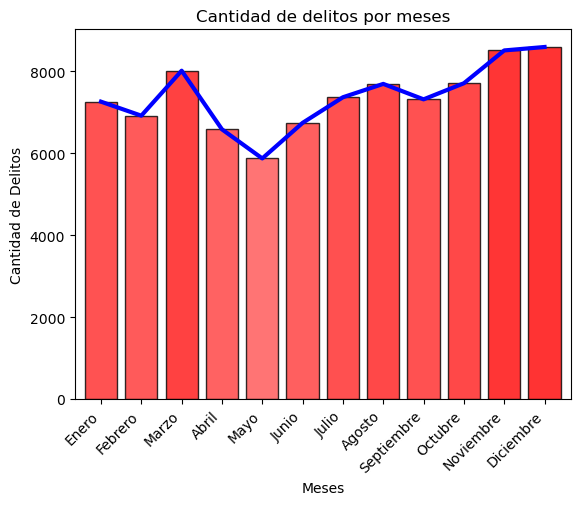

In [44]:
# Define el orden de los meses
meses_ordenados = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']

# Crea la serie ordenada
incidentes_por_mes = data["mes"].value_counts().loc[meses_ordenados]

# Normaliza los valores de frecuencia
max_freq = incidentes_por_mes.max()
incidentes_por_mes_norm = incidentes_por_mes / max_freq

# Define la escala de colores personalizada
colors = [(1, 1, 1), (1, 0, 0)]  # desde blanco (1, 1, 1) a rojo oscuro (1, 0, 0)
cmap = plt.cm.colors.LinearSegmentedColormap.from_list('custom_cmap', colors)

# Crea el gráfico de barras
n_bars = 12
ax = incidentes_por_mes.plot.bar(
    color=cmap(incidentes_por_mes_norm),
    edgecolor='black',
    width=0.8,
    alpha=0.8,
    align='center'
)

# Agrega la línea
ax.plot(incidentes_por_mes.index, incidentes_por_mes.values, color='blue', linewidth=3)

# Ajusta los ejes
ax.set_xlabel("Meses")
ax.set_ylabel("Cantidad de Delitos")
ax.set_title("Cantidad de delitos por meses")
ax.set_xticklabels(incidentes_por_mes.index, rotation=45, ha='right')

# Muestra el gráfico
plt.show()



### Grafico de barras de la frecuencia de delitos por dia de la semana
Se quiere saber cuales son los diás de la semana con mayor cantidad de delitos denunciados

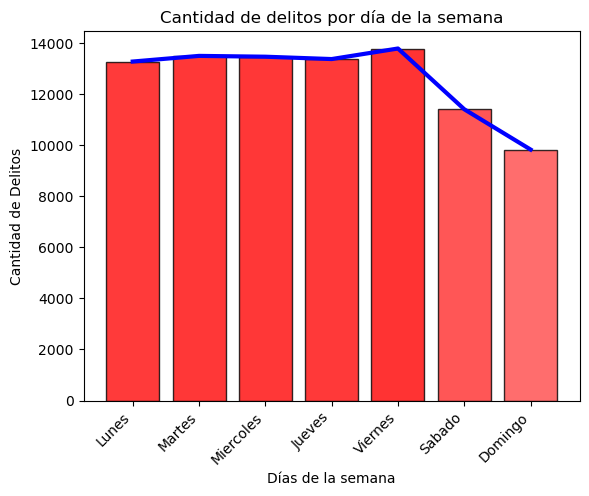

In [60]:
# Define el orden de los días de la semana
dias_ordenados = ['Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sabado', 'Domingo']

# Crea la serie ordenada
incidentes_por_dia = data["dia"].value_counts().loc[dias_ordenados]

# Normaliza los valores de frecuencia
max_freq = incidentes_por_dia.max()
incidentes_por_dia_norm = incidentes_por_dia / max_freq

# Define la escala de colores personalizada
colors = [(1, 1, 1), (1, 0, 0)]  # desde blanco (1, 1, 1) a rojo oscuro (1, 0, 0)
cmap = plt.cm.colors.LinearSegmentedColormap.from_list('custom_cmap', colors)

# Crea el gráfico de barras
n_bars = 7
fig, ax = plt.subplots()
ax.bar(incidentes_por_dia.index, incidentes_por_dia.values, color=cmap(incidentes_por_dia_norm), edgecolor='black', alpha=0.8)

# Agrega la línea
ax.plot(incidentes_por_dia.index, incidentes_por_dia.values, color='blue', linewidth=3)

# Ajusta los ejes
ax.set_xlabel("Días de la semana")
ax.set_ylabel("Cantidad de Delitos")
ax.set_title("Cantidad de delitos por día de la semana")
ax.set_xticks(range(len(incidentes_por_dia)))
ax.set_xticklabels(incidentes_por_dia.index, rotation=45, ha='right')

# Muestra el gráfico
plt.show()

### Grafico de torta con proporcion segun tipo de delito

#### En este grafico de torta se edito el mismo para separar el delito con mayor predominancia

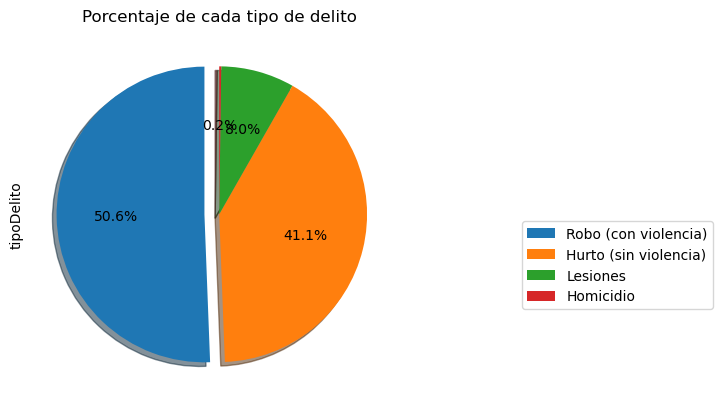

In [21]:
# Crear el gráfico de tarta
data["tipoDelito"].value_counts().plot.pie(autopct='%.1f%%', startangle=90, explode=[0.1, 0,0,0],
                                     shadow=True,
                                     labels=None, pctdistance=0.6,
                                     labeldistance=1.1)

# Añadir título y leyenda
plt.title("Porcentaje de cada tipo de delito")

plt.legend(labels=data["tipoDelito"].value_counts().index, bbox_to_anchor=(1.3, 0.5))

# Mostrar el gráfico
plt.show()

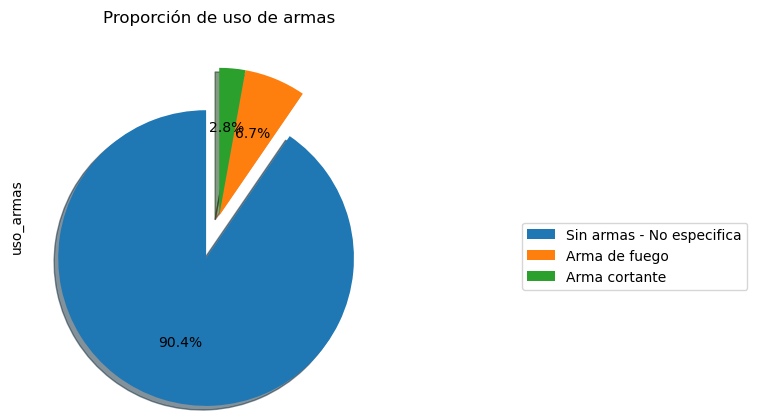

In [31]:

# Crear el gráfico de tarta
data["uso_armas"].value_counts().plot.pie(autopct='%.1f%%', startangle=90, explode=[0.3, 0,0],
                                     shadow=True,
                                     labels=None, pctdistance=0.6,
                                     labeldistance=1.1)

# Añadir título y leyenda
plt.title("Proporción de uso de armas")

plt.legend(labels=data["uso_armas"].value_counts().index, bbox_to_anchor=(1.3, 0.5))

# Mostrar el gráfico
plt.show()

### Mapa del Delito

In [22]:
data6 = data.groupby(['barrio','longitud','latitud'])['tipoDelito'].count().reset_index()
data6 = data6.dropna(subset=['latitud', 'longitud'], how='any')
data6.rename(columns={'tipoDelito': 'cantidad'}, inplace=True)
data6 = data6.drop(data6[(data6['latitud'] == 'SD') | (data6['longitud'] == 'SD')].index)
data6['latitud'] = data6['latitud'].astype(str).str.replace(',', '.').astype(float)
data6['longitud'] = data6['longitud'].astype(str).str.replace(',', '.').astype(float)
data6.dtypes

barrio       object
longitud    float64
latitud     float64
cantidad      int64
dtype: object

In [23]:
data6

,barrio,longitud,latitud,cantidad
0,Agronomía,-58.476035,-34.592091,1
1,Agronomía,-58.476432,-34.592481,3
2,Agronomía,-58.476512,-34.592467,1
3,Agronomía,-58.476686,-34.593639,1
4,Agronomía,-58.477241,-34.595179,1
...,...,...,...,...
56159,Vélez Sársfield,-58.506062,-34.628425,1
56160,Vélez Sársfield,-58.506193,-34.628279,2
56161,Vélez Sársfield,-58.506301,-34.628323,2
56162,Vélez Sársfield,-58.506738,-34.627144,1


In [24]:
import plotly.graph_objects as go
token = 'pk.eyJ1IjoicHJpc2NpbGFjZSIsImEiOiJja3B5MzB5MW4wNTh0MnBwazRwcndsbzhpIn0.Vfhtbes8SPKW2TKEhNcrrQ'

fig = go.Figure(go.Scattermapbox(
    lon=data6.longitud,
    lat=data6.latitud,
    mode = "markers+text",
    marker=go.scattermapbox.Marker(size=data6.cantidad,
                                    color=data6.cantidad,
                                    colorscale='Edge',
                                    showscale=True,
                                    sizemode='diameter', #area #cmbia los pixeles
                                    opacity=0.8),
    hoverinfo='text',
    hovertext=
    'Barrio: ' + data6['barrio'].astype(str) + '' +
    'Cantidad de delitos: ' + data6['cantidad'].astype(str) + '' 
))

fig.update_layout(
    hovermode='x',
    #paper_bgcolor='#010915',
    margin=dict(r=0, l =0, b = 0, t = 0),
    mapbox=dict(
        accesstoken= token,
        style= 'stamen-terrain',  
        zoom= 10,
        center=dict(
            lat = -34.6083,	
            lon = -58.3712
        )
    ),
    showlegend = True,
    autosize=True 
 )
     

## Conclusiones
En conclusión, los datos analizados muestran una clara disparidad en la cantidad de delitos registrados en diferentes barrios de la ciudad. Palermo y Balvanera presentan las tasas más altas de delitos, mientras que Nueva Pompeya y Puerto Madero tienen las tasas más bajas. Además, la franja horaria entre las 18 y las 19 horas es la que registra la mayor cantidad de delitos.

El tipo de delito más abundante es el robo con violencia, lo que indica que las autoridades deben prestar especial atención a la prevención de este tipo de delito en toda la ciudad.

Finalmente, se observa que los barrios de Barracas y Flores tienen la tasa más alta de homicidios, lo que indica la necesidad de tomar medidas específicas para reducir la violencia en estas áreas.

Estos datos son importantes para la planificación y ejecución de políticas públicas enfocadas en la seguridad ciudadana, ya que permiten identificar las áreas donde se requiere una mayor atención y los tipos de delitos que deben abordarse con mayor prioridad.